In [383]:
import numpy as np
import matplotlib.pyplot as plt
import sympy as sy
from itertools import combinations

In [384]:
def generate_binary_vectors(n):
    binary_vectors = np.array([[int(j) for j in format(i, '0'+str(n)+'b')] for i in range(2**n)])#n차원의 모든 이진벡터 생성
    return binary_vectors   
P = np.linspace(0, 0.5, 100)

In [385]:
def func2(result,n):
    A=[]
    for subset in result:
        T=True
        for i in subset:
            for a,b in enumerate(i):
                if b==0:
                    B=i.copy()
                    B[a]=1
                    if B not in subset:
                        T=False
                        break
                if T==False:
                    break
            if T==False:
                break
            for a,b in combinations(range(len(i)),2):
                if i[a]==1 and i[b]==1:
                    continue
                B=i.copy()
                B[a]=1
                B[b]=1
                if i[a]==1 and i[b]==0:
                    if B not in subset:
                        T=False
                        break
                C=i.copy()
                C[a]=1
                C[b]=0
                if i[a]==0 and i[b]==1:
                    if B not in subset or C not in subset:
                        T=False
                        break
                D=i.copy()
                C[a]=0
                C[b]=1
                if i[a]==0 and i[b]==0:
                    if B not in subset or C not in subset or D not in subset:
                        T=False
                        break
            if T==False:
                break
        if T==True and len(subset) !=0:
            A.append(subset) 
    return [np.array(sublist) for sublist in A]
def Boolean_func2(n):                   #dp 사용해서 n=5일떄 A구해짐
    if n==2:
        A=[
                [[1, 1]],
                [[1, 0], [1, 1]],
                [[0, 1], [1, 0], [1, 1]],
                [[0, 0], [0, 1], [1, 0], [1, 1]]]
        A=[np.array(sublist) for sublist in A]
        return A
    B=Boolean_func2(n-1)
    A=[]
    for b in B:             #n-1차원 에서 구한 A집합에 0번쨰 자리에 1추가
        D=[]
        for i in b:
            C=[1]
            for m in i:
                C.append(m)
            D.append(C)
        A.append(D)
    result=[]
    B.clear()                       # n-1차원 에서 A집합에 0번쨰 자리에 1추가한 애들대상으로, n-1차원에서 A집합에 0번째 자리에 0 추가한 애들의 부분집합과 합쳐서 조건 만족하는지 비교
    arr = generate_binary_vectors(n-1)
    for i in range(arr.shape[0]+1):
        combinations_list = list(combinations(arr,i))
        combinations_list = [[x.tolist() for x in sublist] for sublist in combinations_list]  
        combinations_list = [[list(x) for x in sublist] for sublist in combinations_list]
        for comb in combinations_list:
            result.append(comb)
    for r in result[1:]:
        D=[]
        for i in r:
            C=[0]
            for m in i:
                C.append(m)
            D.append(C)
        B.append(D)
    C=[]
    for a in A[2:]:
        for b in B:
            C.append(b+a)
    A=[np.array(sublist) for sublist in A]
    return A+func2(C,n)

In [386]:
def title(A):       #plot.title 할떄 사용
    B = []
    for a in A:
        s = '{'
        for i,v in enumerate(a):
            if i != 0:
                s+=','
            s += ''.join(map(str, v))
        s += '}'
        B.append(s)
    return B

In [426]:
def q_y2(p,y,A,tau):         #p일떄 q(y)값 구하기 method 3방식
  T=generate_binary_vectors(A.shape[1]) 
  totala=0
  totalb=0
  for a in A:
    totala+=p_y(p,y,a)
  totala = np.around((1-tau)*totala/A.shape[0],10)
  for t in T:
    ttr=False
    for a in A:
      tr=True
      for n in range(t.shape[0]):
        if t[n]!=a[n]:
          tr=False
          break
      if tr==True:
        ttr=True
        break
    if ttr==False:
      totalb+=p_y(p,y,t)
  if len(T)==A.shape[0]:
    totalb=0
  else:
    totalb=np.around(tau*totalb/(len(T)-A.shape[0]),10)
  return totala+totalb

def p_y(p,y,a):     #p(y|x)구하기
  sum=1
  for i in range(a.shape[0]):
    if y[i]==a[i]:
      sum*=(1-p)
    else:
      sum*=p
  return sum

In [466]:
def tan_line(m,A,co,tau): #접선구하기
    T=generate_binary_vectors(A.shape[1]) 
    x=sy.Symbol('x')
    total=0
    totala=0
    totalb=0
    for a in A:
        sum=1
        for r,s in zip(m,a):
            if r==s:
                sum*=(1-x)
            else:
                sum*=x
        totala+=sum
    totala/=A.shape[0]
    totala*=(1-tau)
    for t in T:
      ttr=False
      for a in A:
        tr=True
        for n in range(t.shape[0]):
          if t[n]!=a[n]:
            tr=False
            break
        if tr==True:
          ttr=True
          break
      if ttr==False:
        sum=1
        for r,s in zip(m,t):
            if r==s:
              sum*=(1-x)
            else:
              sum*=x   
        totalb+=sum
    if len(T)==A.shape[0]:
      totalb=0
    else:
      totalb/= (len(T)-A.shape[0])
      totalb*=tau
    total=totala+totalb
    derivative = total.diff()
    result = derivative.subs(x,0.5)
    if len(T)==A.shape[0]:
      plt.plot(P,result*(P-1/2)+(1-tau)*1/(2**m.shape[0]),'--',color=co)
    else:
       plt.plot(P,result*(P-1/2)+1/(2**m.shape[0]),'--',color=co)


In [475]:
def graph(n,tau):
    A=Boolean_func2(n)
    T=generate_binary_vectors(n)  
    for b,a in enumerate(A):
        C=[]
        D=[]
        alpha=0
        beta=1
        plt.figure()
        for i in T:
            y=q_y2(P,i,a,tau)
            is_in = any((i == row).all() for row in a)  #i가 a에 속하면 빨간색 선
            if is_in:
                co='red'
            else:
                co='blue'
            plt.plot(P,y,color=co)
            if not is_in:   #blue
                if y[0]<=y[99]:
                    if y[50]>alpha:
                        alpha=y[50]
                        C.clear()
                        C.append(i)
                    elif y[50]==alpha:
                        C.append(i)
                else:
                    if y[50]<beta:
                        beta=y[50]
                        C.clear()
                        C.append(i)
                    elif y[50]==beta:
                        C.append(i)
            else:         #red
                if y[0]>=y[99]:
                    if y[50]<beta:
                        beta=y[50]
                        D.clear()
                        D.append(i)
                    elif y[50]==beta:
                        D.append(i)
                else:
                    if y[50]>alpha:
                        alpha=y[50]
                        D.clear()
                        D.append(i)
                    elif y[50]==alpha:
                        D.append(i)
        tan_line(D[0],a,'red',tau)
        if len(C)!=0:
            tan_line(C[0],a,'blue',tau)
        D_str = '{' + ','.join([''.join(map(str, arr)) for arr in D[::-1]]) + '}'
        C_str = '{' + ','.join([''.join(map(str, arr)) for arr in C[::-1]]) + '}'
        plt.figtext(0, 0.7, f'Red:{D_str}', ha='right', va='top', fontsize=12, color='red')
        plt.figtext(0, 0.5, f'Blue:{C_str}', ha='right', va='top', fontsize=12, color='blue')
        plt.title(f'A={title(A)[b]}')
        plt.xlabel('p')
        plt.ylabel('q')
        plt.show()

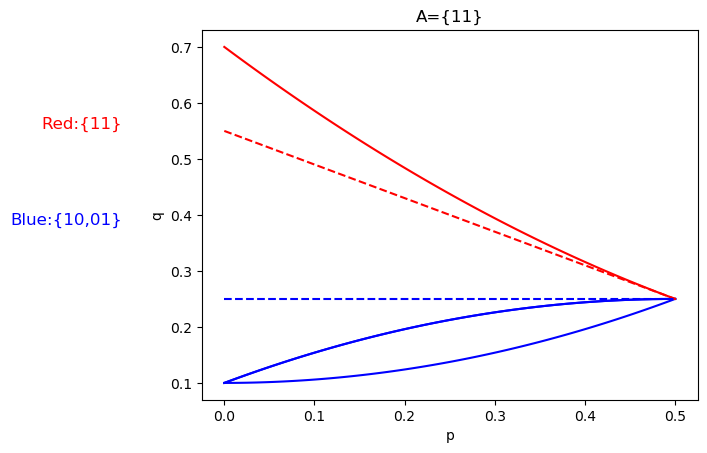

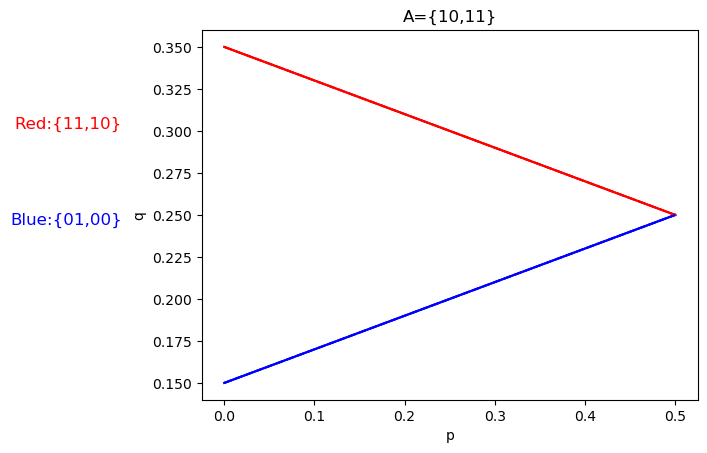

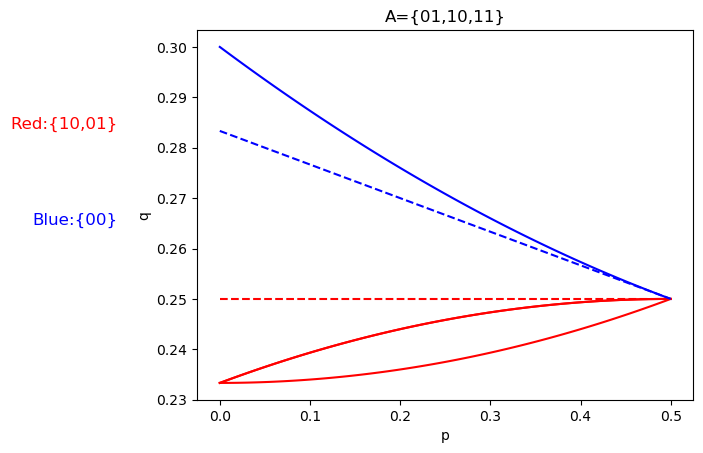

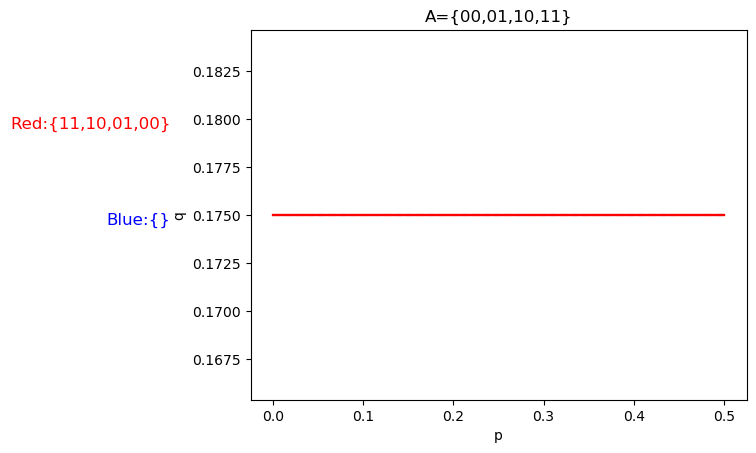

In [476]:
graph(2,0.3)


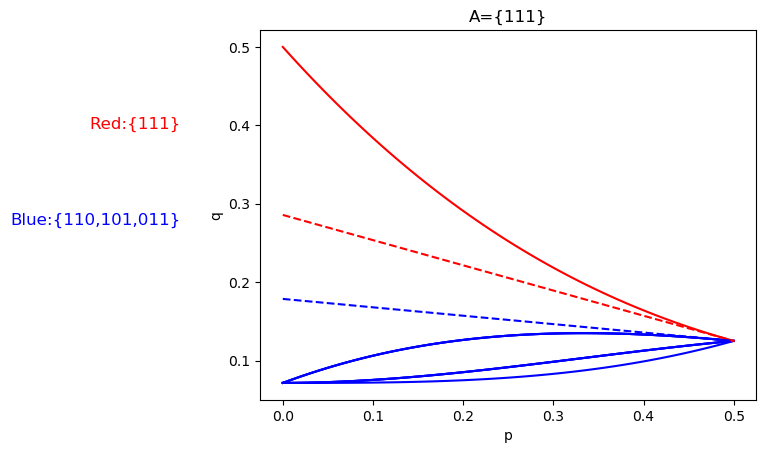

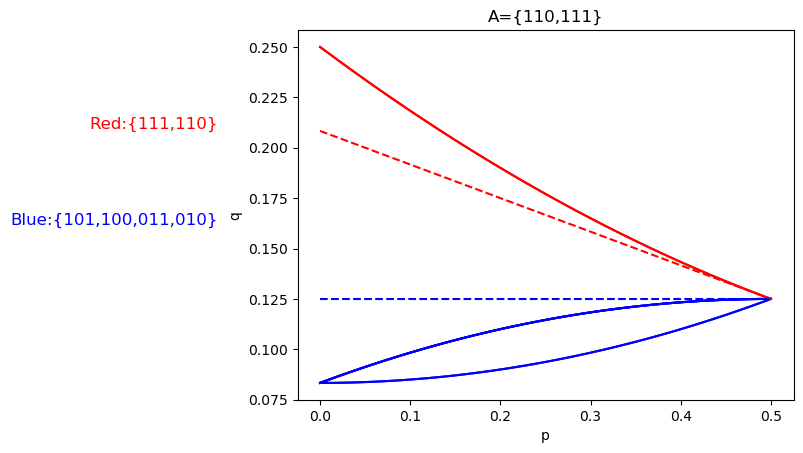

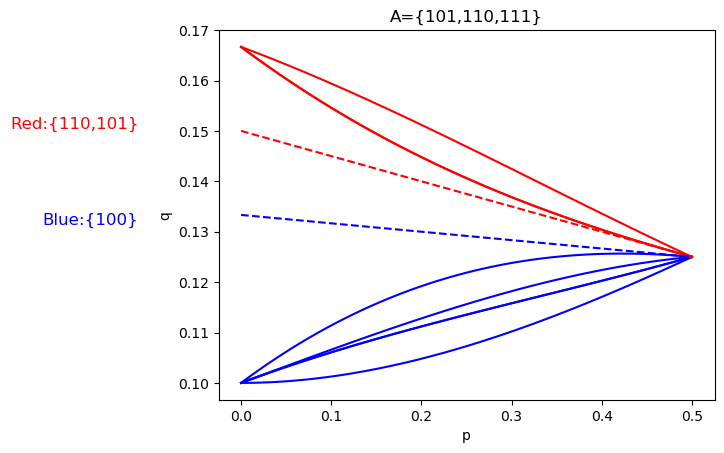

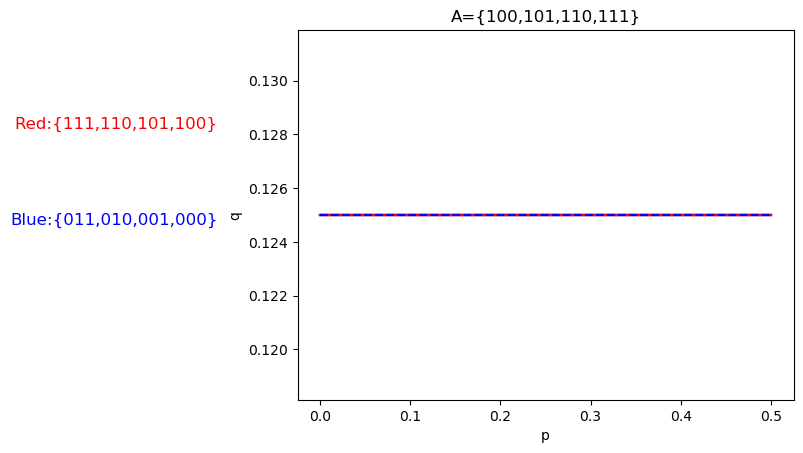

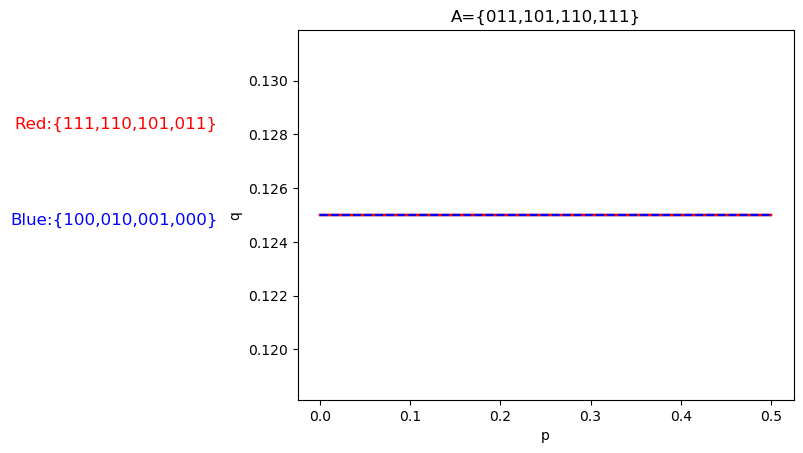

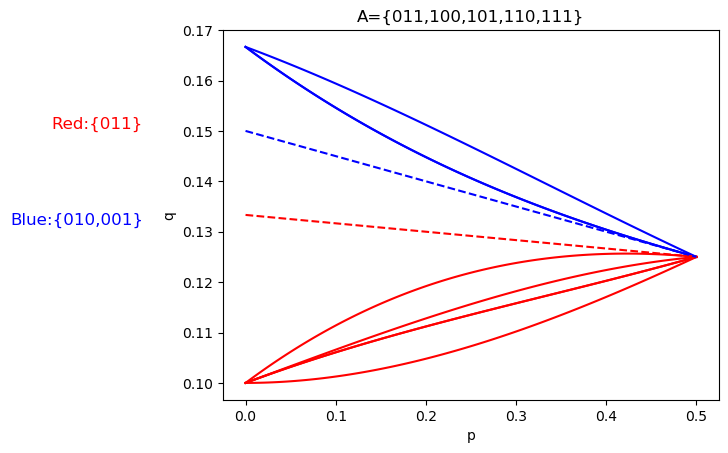

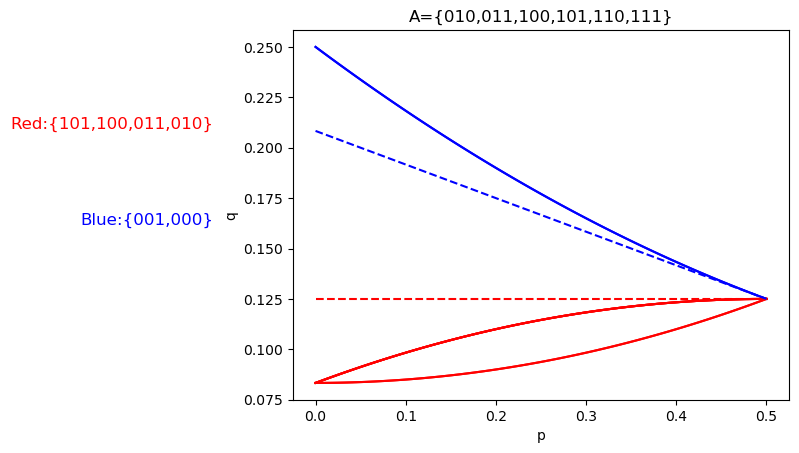

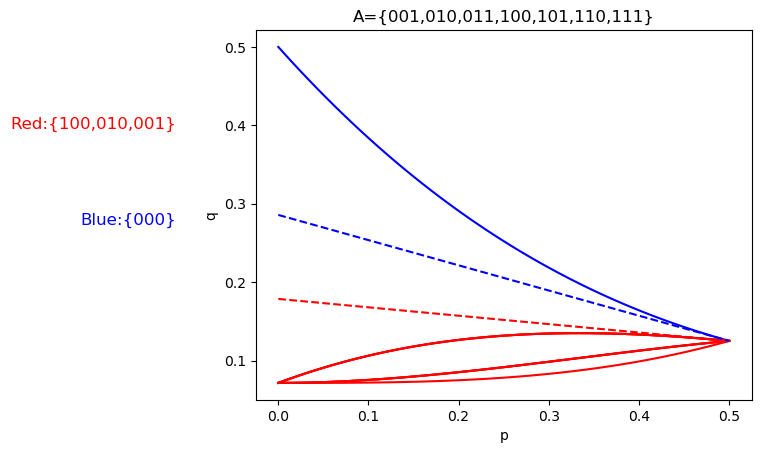

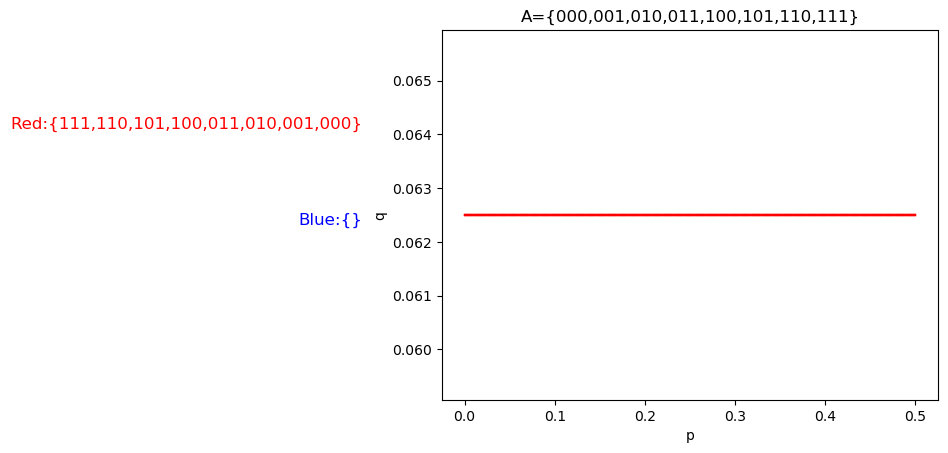

In [477]:
graph(3,0.5)

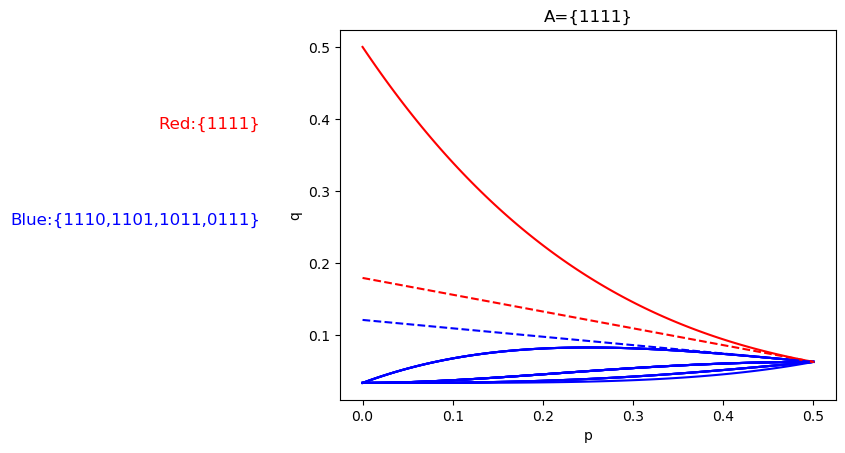

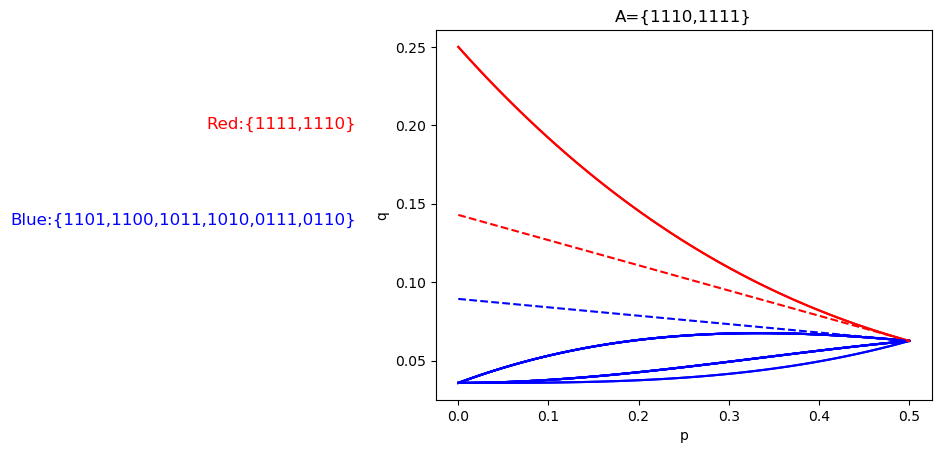

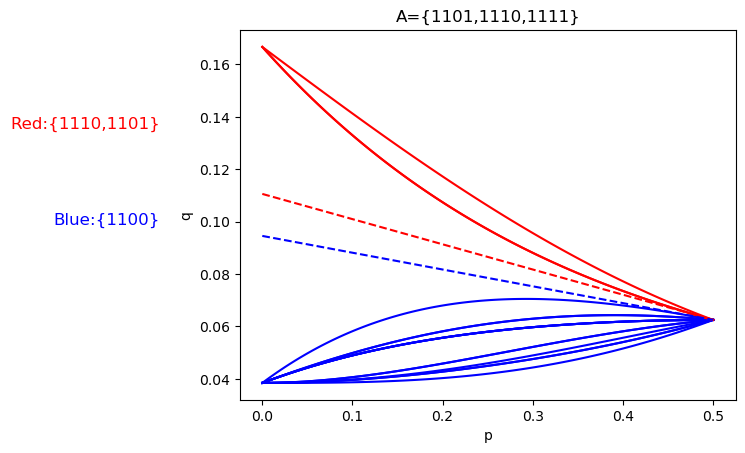

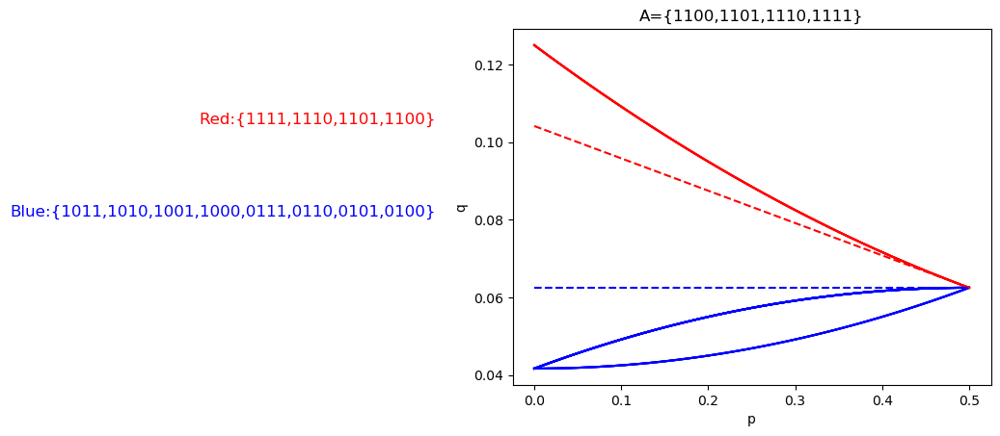

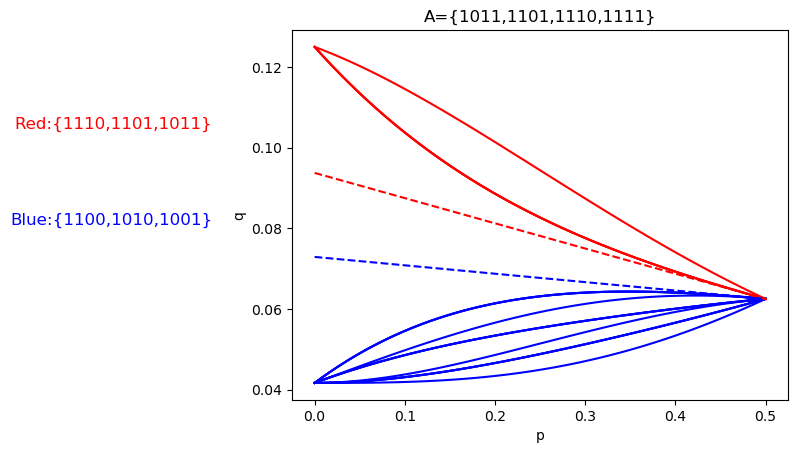

...

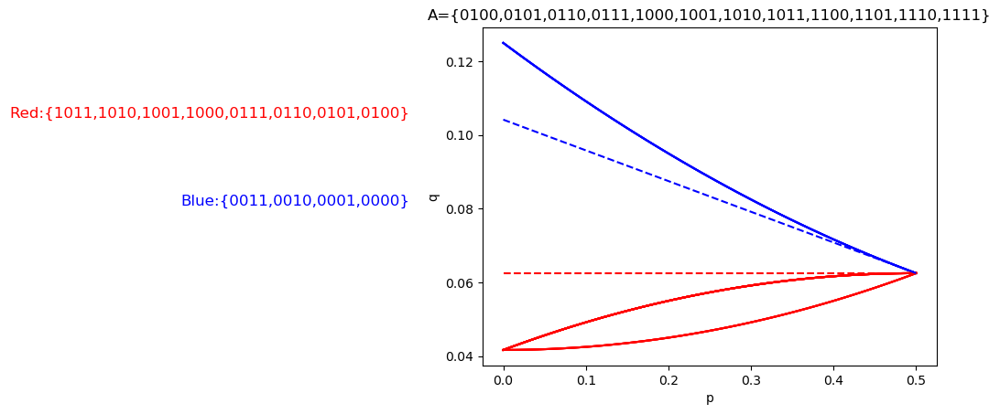

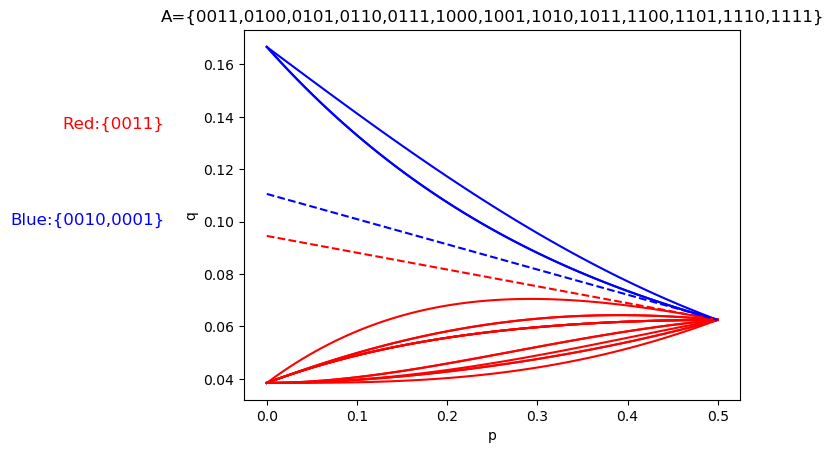

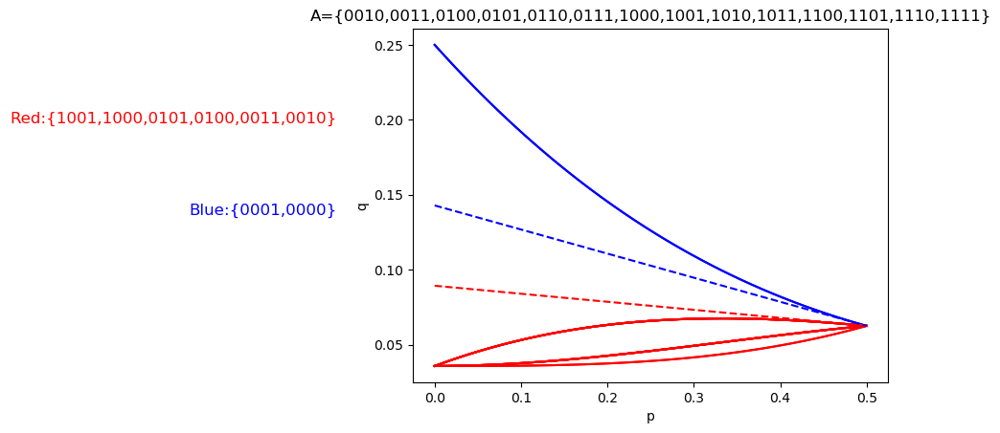

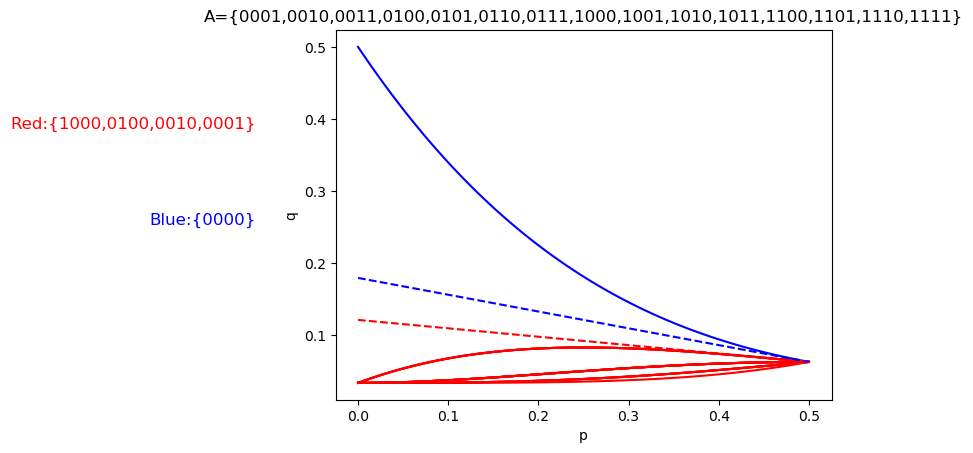

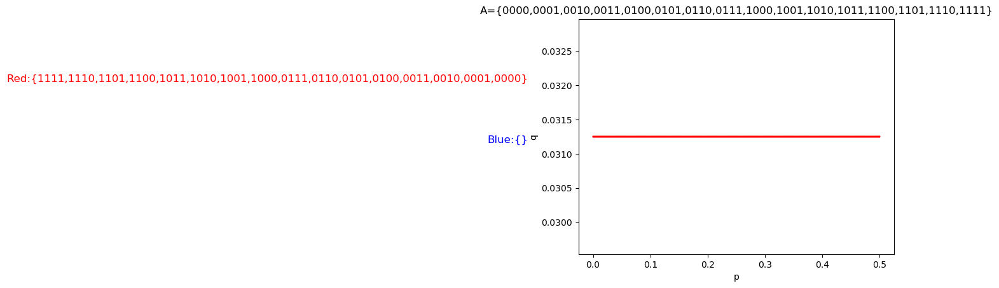

In [478]:
graph(4,0.5)

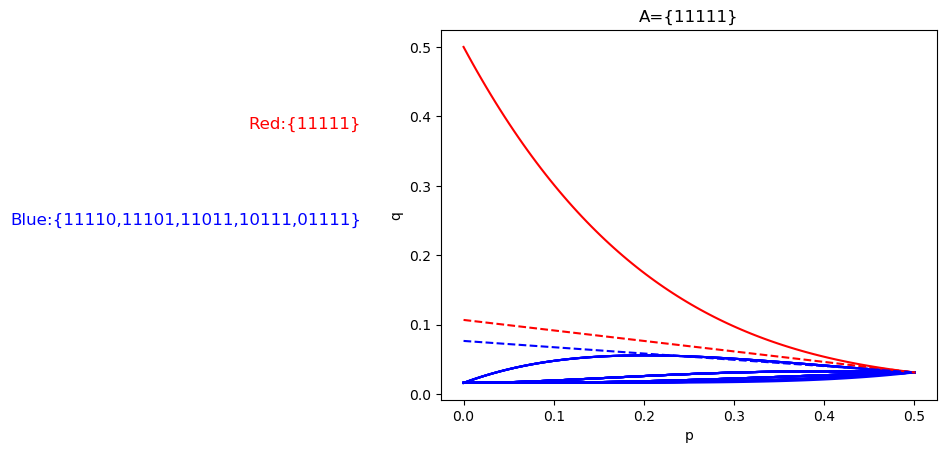

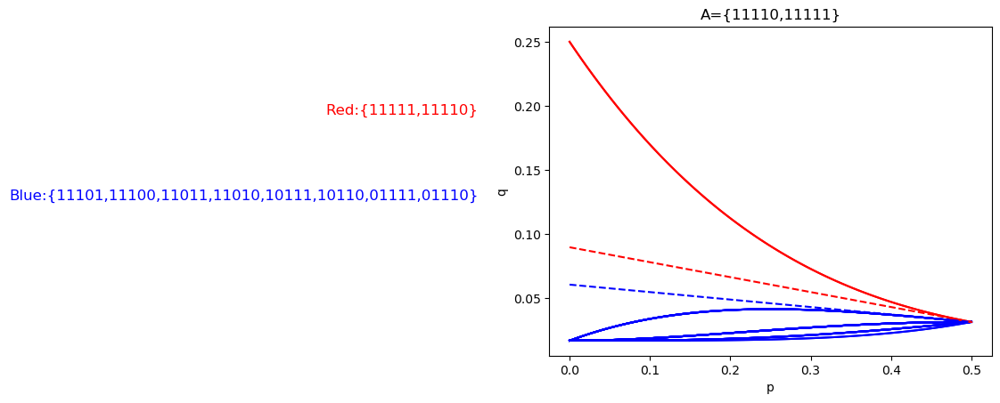

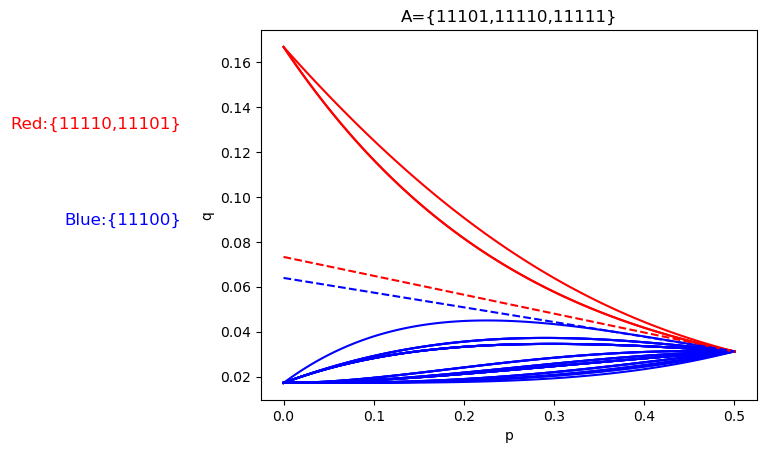

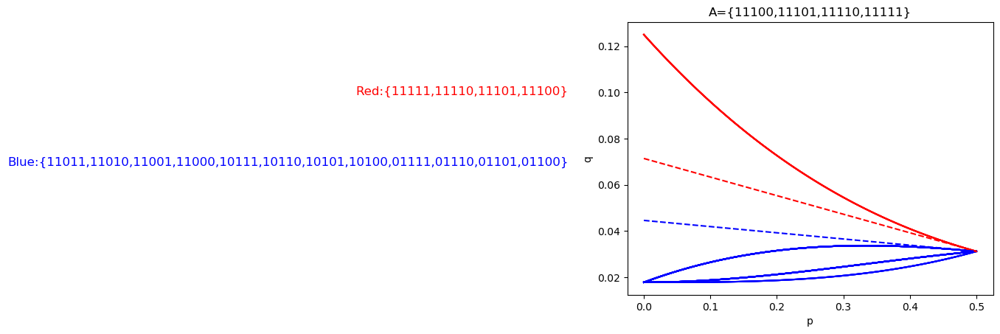

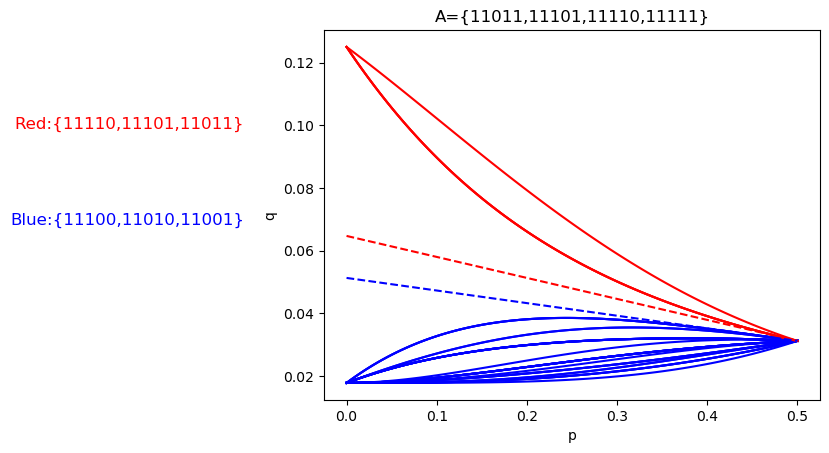

...

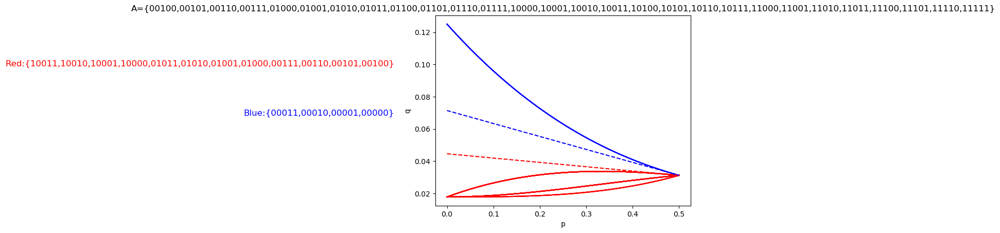

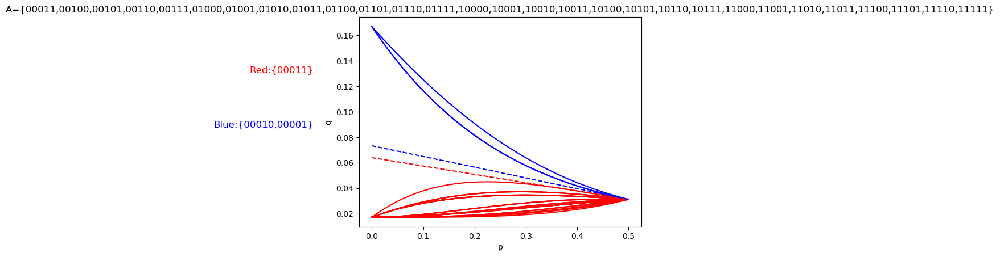

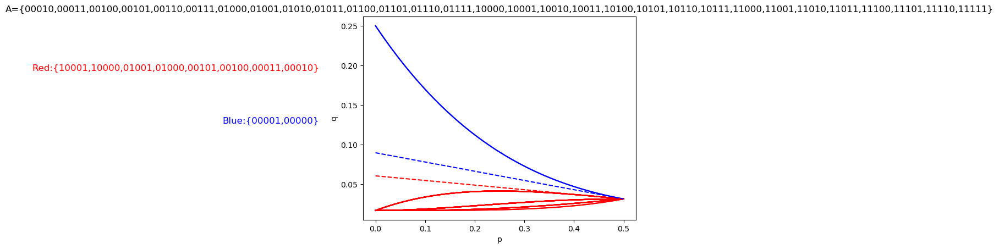

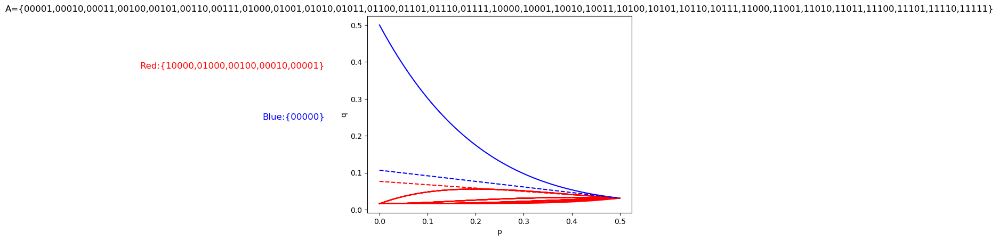

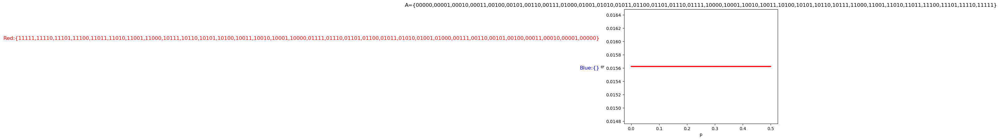

In [479]:
graph(5,0.5)